# NMF Practical Work

**Roland Badeau - Notebook code by Umut Simsekli**

Telecom Paris - TSIA 206

In [ ]:
import numpy as np

# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

# and IPython.display for audio output
import IPython.display as ipd

# Librosa for audio
import librosa
# # And the display module for visualization
import librosa.display


<ipython-input-6-6510babf4f1a>:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  ms.use('seaborn-muted')


<Figure size 640x480 with 0 Axes>

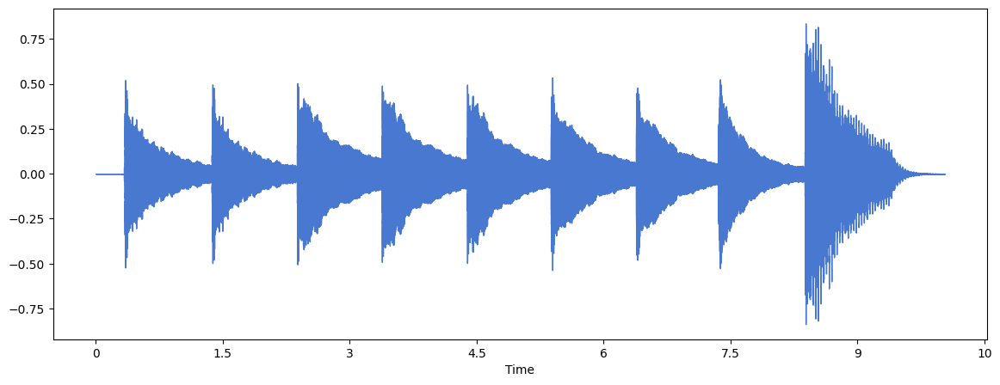

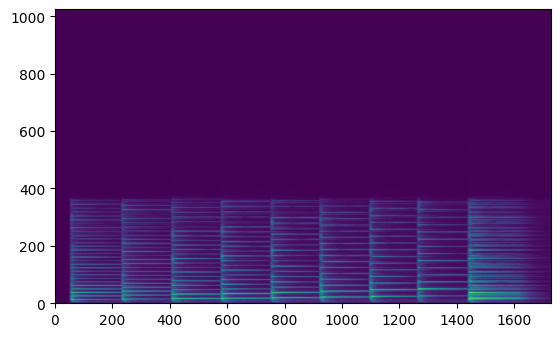

In [ ]:
# Audio file
fname = 'Cmajor_piano8khz.wav'

# Load signal
y, sr = librosa.load(fname)

# Compute STFT
Xstft = librosa.stft(y, n_fft=2048, hop_length=512, win_length=None)
X = np.abs(Xstft)

#Visualize the waveform
plt.figure()
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)

#Visualize the spectrum
plt.figure()
plt.imshow(X**0.3)
plt.gca().invert_yaxis()


# 1.


When we differentiate the cost function, we obtain:
$\frac{{\partial \delta_{\beta}}}{{\partial W}} = 0 - \frac{(\beta-1)X (WH)^{\beta-2}H^T}{\beta-1} + \frac{\beta (WH)^{\beta-1}H^T}{\beta}$
$ = - X (WH)^{\beta-2}H^T + (WH)^{\beta-1}H^T $


So when we do a gradient descent on W :
$ W ⬅ W - \eta_W * ( - X(WH)^{\beta-2}H^T + (WH)^{\beta-1}H^T) $

If we take $\eta_W = \frac{W}{(WH)^{\beta-1}H^T}$,

We then have:

$$ W ⬅ W - \frac{W}{(WH)^{\beta-1}H^T}( - X (WH)^{\beta-2}H^T + (WH)^{\beta-1}H^T) $$
$$ ⬅ W(1 + \frac{X (WH)^{\beta-2}H^T}{(WH)^{\beta-1}H^T} -1) $$
$$ ⬅ W ◦ \frac{X◦\hat{X}^{\beta-2}H^T}{\hat{X}^{\beta-1}H^T} $$

Now we do the same for H:
$\frac{{\partial \delta_{\beta}}}{{\partial H}} = 0 - \frac{(\beta-1)W^T (X◦(WH)^{\beta-1})}{\beta-1} + \frac{\beta W^T(WH)^{\beta-1}}{\beta}$
$ = -W^T (X◦(WH)^{\beta-2}) + W^T(WH)^{\beta-1} $

So we have when doing a gradient descent:
$ H ⬅ H - \eta_H ( -W^T (X◦(WH)^{\beta-2}) + W^T(WH)^{\beta-1})$

If we take $\eta_H = \frac{H}{W^T(WH)^{\beta-1}} $,

Then we obtain:

$$ H ⬅ H - \frac{H}{W^T(WH)^{\beta-1}} ( -W^T (X◦(WH)^{\beta-2}) + W^T(WH)^{\beta-1}) $$
$$ ⬅ H(1 + \frac{W^T (X◦(WH)^{\beta-2})}{W^T(WH)^{\beta-1}}  -1) $$
$$ ⬅ H◦\frac{W^T (X◦\hat{X}^{\beta-2})}{W^T \hat{X}^{\beta-1}}  $$

# 2.


In [ ]:
# Implement MUR for NMF with beta-divergence

def MUR(X, k, beta=2, iterations=100):
  # Initialisation de W et H
  i, j = X.shape
  W = np.random.rand(i, k)
  H = np.random.rand(k, j)
  for _ in range(iterations):

    X_hat = W@H
    tmp = X * np.power(X_hat+1e-6, beta-2)
    tmp = tmp @ H.T
    tmp = tmp / (np.power(X_hat+1e-6, beta-1)@ H.T)
    W = W * tmp

    X_hat = W @ H
    tmp = X * np.power(X_hat+1e-6, beta-2)
    tmp = W.T @ tmp
    tmp = tmp / (W.T @ np.power(X_hat+1e-6, beta-1))
    H = H * tmp

  return W, H

In [ ]:
W, H = MUR(X, 8, beta=2)

In [ ]:
# Use Wiener filtering to reconstruct each note separately
def get_note(W, H, X, i):
  tmp = W[:, i:i+1] @ H[i:i+1, :]
  tmp = tmp / (W@H+1e-6)
  return X * tmp

# Example reconstruction
y_hat = librosa.istft(Xstft)
ipd.Audio(y_hat, rate=sr)


In [ ]:
k=8
notes = []
for i in range(k):

  note = get_note(W, H, X, i)
  notes.append(librosa.istft(note))

In [ ]:
ipd.Audio(notes[0], rate=sr)


In [ ]:
ipd.Audio(notes[1], rate=sr)


In [ ]:
ipd.Audio(notes[2], rate=sr)

In [ ]:
ipd.Audio(notes[4], rate=sr)

In [ ]:
ipd.Audio(notes[5], rate=sr)

In [ ]:
ipd.Audio(notes[6], rate=sr)

In [ ]:
ipd.Audio(notes[7], rate=sr)

# 3.

If we reduce the number of columns of W, we have several notes on the same reconstructed source. Conversely, if we choose a higher value for k, we have some reconstruction without any note (or very low).

When $\beta$ equals 2 we have a good reconstruction for each note, whereas when it's equal to 1 or 0, we perceive some default on some notes such as echoes.

When the window size of the sift is low, the reconstruction is very bad. We hear a repetition of the same note. The higher the window length, the better the reconstruction.

When we take a lower hope size, it changes the rate, and so the signal becomes longer.


